In [7]:
import numpy as np
import PIL
from PIL import Image
import numpy as np
import torch
import os
import sys

sys.path.append('..')
os.chdir('..')
print(os.getcwd()) # confirm the working directory is the repo root

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

/scratch3/zha439/project/alphagen/negtome


In [8]:
def display_alongside_batch(img_list, resize_dims=(512,512)):
    if isinstance(resize_dims, int):
        resize_dims = (resize_dims,resize_dims)
    res = np.concatenate([np.array(img.resize(resize_dims)) for img in img_list], axis=1)
    return Image.fromarray(res)

In [12]:
import torch

from diffusers import AutoencoderKL, DPMSolverMultistepScheduler, StableDiffusionXLPipeline
from diffusers.models import ImageProjection
from diffusers.utils import load_image


def encode_image(
    image_encoder,
    feature_extractor,
    image,
    device,
    num_images_per_prompt,
    output_hidden_states=None,
    negative_image=None,
):
    dtype = next(image_encoder.parameters()).dtype

    if not isinstance(image, torch.Tensor):
        image = feature_extractor(image, return_tensors="pt").pixel_values

    image = image.to(device=device, dtype=dtype)
    if output_hidden_states:
        image_enc_hidden_states = image_encoder(image, output_hidden_states=True).hidden_states[-2]
        image_enc_hidden_states = image_enc_hidden_states.repeat_interleave(num_images_per_prompt, dim=0)

        if True: # dont use positive embeddings
            image_enc_hidden_states = image_encoder(
                torch.zeros_like(image), output_hidden_states=True
            ).hidden_states[-2]
            image_enc_hidden_states = image_enc_hidden_states.repeat_interleave(num_images_per_prompt, dim=0)

        if negative_image is None:
            uncond_image_enc_hidden_states = image_encoder(
                torch.zeros_like(image), output_hidden_states=True
            ).hidden_states[-2]
        else:
            if not isinstance(negative_image, torch.Tensor):
                negative_image = feature_extractor(negative_image, return_tensors="pt").pixel_values
            negative_image = negative_image.to(device=device, dtype=dtype)
            uncond_image_enc_hidden_states = image_encoder(negative_image, output_hidden_states=True).hidden_states[-2]

        uncond_image_enc_hidden_states = uncond_image_enc_hidden_states.repeat_interleave(num_images_per_prompt, dim=0)
        return image_enc_hidden_states, uncond_image_enc_hidden_states
    else:
        image_embeds = image_encoder(image).image_embeds
        image_embeds = image_embeds.repeat_interleave(num_images_per_prompt, dim=0)
        uncond_image_embeds = torch.zeros_like(image_embeds)

        return image_embeds, uncond_image_embeds


@torch.no_grad()
def prepare_ip_adapter_image_embeds(
    unet,
    image_encoder,
    feature_extractor,
    ip_adapter_image,
    do_classifier_free_guidance,
    device,
    num_images_per_prompt,
    ip_adapter_negative_image=None,
):
    if not isinstance(ip_adapter_image, list):
        ip_adapter_image = [ip_adapter_image]

    if len(ip_adapter_image) != len(unet.encoder_hid_proj.image_projection_layers):
        raise ValueError(
            f"`ip_adapter_image` must have same length as the number of IP Adapters. Got {len(ip_adapter_image)} images and {len(unet.encoder_hid_proj.image_projection_layers)} IP Adapters."
        )

    image_embeds = []
    for single_ip_adapter_image, image_proj_layer in zip(
        ip_adapter_image, unet.encoder_hid_proj.image_projection_layers
    ):
        output_hidden_state = not isinstance(image_proj_layer, ImageProjection)
        single_image_embeds, single_negative_image_embeds = encode_image(
            image_encoder,
            feature_extractor,
            single_ip_adapter_image,
            device,
            1,
            output_hidden_state,
            negative_image=ip_adapter_negative_image,
        )
        single_image_embeds = torch.stack([single_image_embeds] * num_images_per_prompt, dim=0)
        single_negative_image_embeds = torch.stack([single_negative_image_embeds] * num_images_per_prompt, dim=0)

        if do_classifier_free_guidance:
            single_image_embeds = torch.cat([single_negative_image_embeds, single_image_embeds])
            single_image_embeds = single_image_embeds.to(device)

        image_embeds.append(single_image_embeds)

    return image_embeds

In [2]:
vae = AutoencoderKL.from_pretrained(
    "madebyollin/sdxl-vae-fp16-fix",
    torch_dtype=torch.float16,
).to("cuda:2")

pipeline = StableDiffusionXLPipeline.from_pretrained(
    "RunDiffusion/Juggernaut-XL-v9",
    torch_dtype=torch.float16,
    vae=vae,
    variant="fp16",
).to("cuda:2")

pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)
pipeline.scheduler.config.use_karras_sigmas = True

pipeline.load_ip_adapter(
    "h94/IP-Adapter",
    subfolder="sdxl_models",
    weight_name="ip-adapter-plus_sdxl_vit-h.safetensors",
    image_encoder_folder="models/image_encoder",
)
pipeline.set_ip_adapter_scale(0.7)

Loading pipeline components...: 100%|████████████████████████████████████████████| 7/7 [00:01<00:00,  4.75it/s]


In [17]:
pipeline.set_ip_adapter_scale(0.3)

100%|██████████████████████████████████████████████████████████████████████████| 25/25 [00:04<00:00,  5.90it/s]


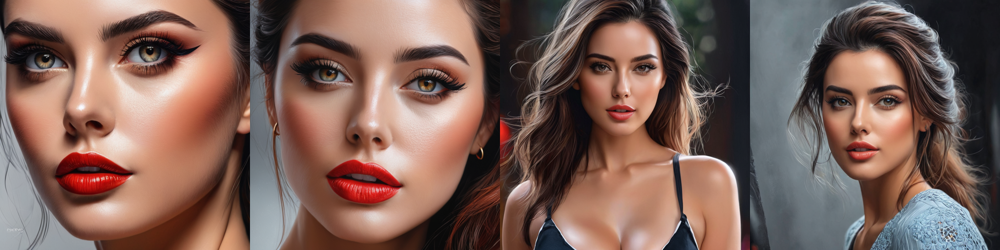

In [23]:
# ip_image = Image.open('') 
ip_image = load_image("./woman-v1.png")
negative_ip_image = load_image("./woman-v1.png")

image_embeds = prepare_ip_adapter_image_embeds(
    unet=pipeline.unet,
    image_encoder=pipeline.image_encoder,
    feature_extractor=pipeline.feature_extractor,
    ip_adapter_image=[[ip_image]],
    do_classifier_free_guidance=True,
    device="cuda:2",
    num_images_per_prompt=1,
    ip_adapter_negative_image=negative_ip_image,
)


prompt = "cinematic photo of a cyborg in the city, 4k, high quality, intricate, highly detailed"
prompt = "a hyper-realistic digital painting of a woman"
negative_prompt = "naked, deformed, bad anatomy, disfigured, poorly drawn face, mutation, extra limb, ugly, disgusting, poorly drawn hands, missing limb, floating limbs, disconnected limbs, blurry, watermarks, oversaturated, distorted hands, amputation"

# set scale to zero for ip-adapter (so base model generations)
# pipeline.set_ip_adapter_scale(0.)
seed = 0
generator = torch.Generator(pipeline.device).manual_seed(seed)
images = pipeline(
    prompt=prompt,
    negative_prompt=negative_prompt,
    ip_adapter_image_embeds=image_embeds,
    num_images_per_prompt = 4,
    guidance_scale=5.0,
    num_inference_steps=25,
    generator=generator,
).images

display_alongside_batch(images, resize_dims=512)

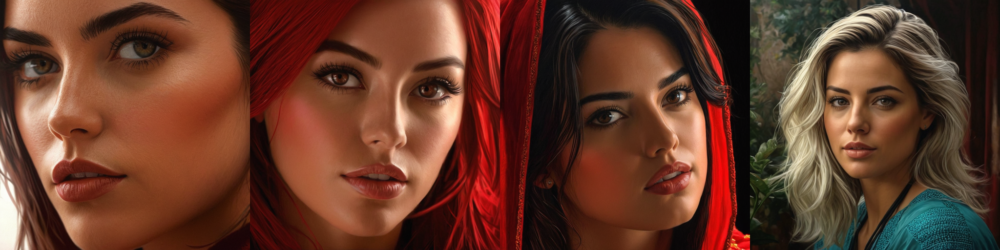

In [19]:
display_alongside_batch(images, resize_dims=512)

100%|██████████████████████████████████████████████████████████████████████████| 50/50 [00:08<00:00,  5.88it/s]


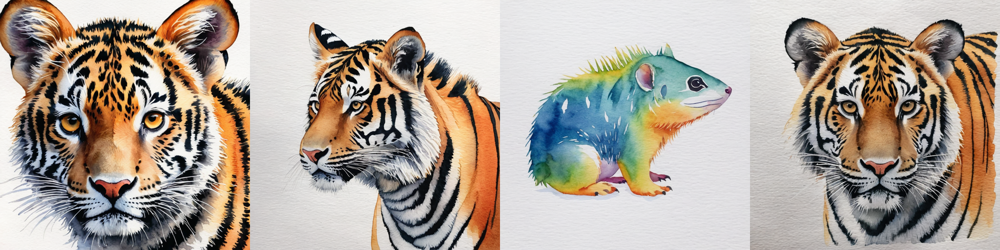

In [33]:
# generate ip adapter negative image

# ip_image = Image.open('') 
ip_image = load_image("./woman-v1.png")
negative_ip_image = load_image("./woman-v1.png")

image_embeds = prepare_ip_adapter_image_embeds(
    unet=pipeline.unet,
    image_encoder=pipeline.image_encoder,
    feature_extractor=pipeline.feature_extractor,
    ip_adapter_image=[[ip_image]],
    do_classifier_free_guidance=True,
    device="cuda:2",
    num_images_per_prompt=1,
    ip_adapter_negative_image=negative_ip_image,
)

prompt = "cinematic photo of a cyborg in the city, 4k, high quality, intricate, highly detailed"
# prompt = "a hyper-realistic digital painting of a woman"
prompt = "a watercolor illustration of an animal."
# prompt = "a watercolor illustration of an person."

negative_prompt = "naked, deformed, bad anatomy, disfigured, poorly drawn face, mutation, extra limb, ugly, disgusting, poorly drawn hands, missing limb, floating limbs, disconnected limbs, blurry, watermarks, oversaturated, distorted hands, amputation"

# set scale to zero for ip-adapter (so base model generations)
pipeline.set_ip_adapter_scale(0.)
seed = 0
generator = torch.Generator(pipeline.device).manual_seed(seed)
neg_images = pipeline(
    prompt=prompt,
    negative_prompt=negative_prompt,
    ip_adapter_image_embeds=image_embeds,
    num_images_per_prompt = 4,
    guidance_scale=5.0,
    num_inference_steps=50,
    generator=generator,
).images

display_alongside_batch(neg_images, resize_dims=512)

100%|██████████████████████████████████████████████████████████████████████████| 25/25 [00:04<00:00,  5.65it/s]


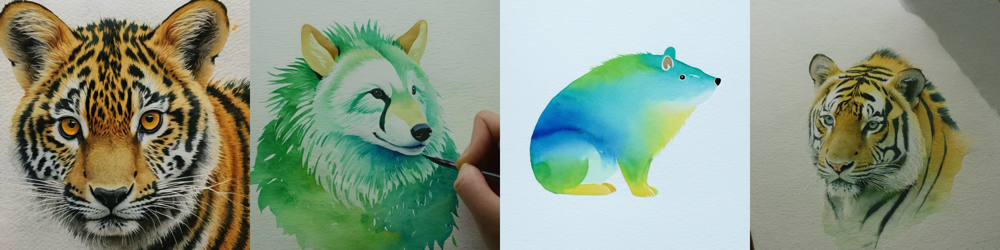

In [35]:
# ip_image = Image.open('') 
neg_image = neg_images[0]
ip_image = neg_image 
negative_ip_image = neg_image

image_embeds = prepare_ip_adapter_image_embeds(
    unet=pipeline.unet,
    image_encoder=pipeline.image_encoder,
    feature_extractor=pipeline.feature_extractor,
    ip_adapter_image=[[ip_image]],
    do_classifier_free_guidance=True,
    device="cuda:2",
    num_images_per_prompt=1,
    ip_adapter_negative_image=negative_ip_image,
)


# prompt = "a hyper-realistic digital painting of a person"
prompt = "a watercolor illustration of an animal."
# prompt = "a watercolor illustration of an person."

negative_prompt = "naked, deformed, bad anatomy, disfigured, poorly drawn face, mutation, extra limb, ugly, disgusting, poorly drawn hands, missing limb, floating limbs, disconnected limbs, blurry, watermarks, oversaturated, distorted hands, amputation"

# set scale to zero for ip-adapter (so base model generations)
pipeline.set_ip_adapter_scale(0.3)
seed = 0
generator = torch.Generator(pipeline.device).manual_seed(seed)
images = pipeline(
    prompt=prompt,
    negative_prompt=negative_prompt,
    ip_adapter_image_embeds=image_embeds,
    num_images_per_prompt = 4,
    guidance_scale=5.0,
    num_inference_steps=25,
    generator=generator,
).images

display_alongside_batch(images, resize_dims=512)